<a href="https://colab.research.google.com/github/camondino/Meli-IAM-Challenge/blob/main/Challenge__v02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Librerias


Instalo las librerías necesarias

In [1]:
!pip3 install matplotlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
!pip install matplotlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
!pip install ydata-profiling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.9/345.9 kB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 60.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.8/679.8 kB 41.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.8/33.8 MB 16.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 27.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 11.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 40.7 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27096 sha256=3cfaed50edacde0915a6ac6108c74303d1216ba023bb35cbf9ba5c20591cbdd1
  Stored in directory: /root/.cache/pip/wheels/1d/05/04/c6d7d3

In [4]:
# Procesamiento
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import OrdinalEncoder

# Modelos
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import KMeans
import plotly.express as px
from sklearn.model_selection import learning_curve

## EDA

In [ ]:
path = '/content/datasetChallangeMeLi.csv'
df = pd.read_csv(path, engine='python', encoding_errors='replace', on_bad_lines='warn') # Si queremos leer menos lineas usamos: nrows=300000 
df

,timestamp,processId,parentProcessId,userId,processName,hostName,eventId,eventName,argsNum,returnValue,args,sus,evil
0,124.440464,387,1,101,systemd-resolve,ip-10-100-1-26,41,socket,3,15,"[{'name': 'domain', 'type': 'int', 'value': 'A...",0,0
1,124.441004,1,0,0,systemd,ip-10-100-1-26,1005,security_file_open,4,0,"[{'name': 'pathname', 'type': 'const char*', '...",0,0
2,124.441045,1,0,0,systemd,ip-10-100-1-26,257,openat,4,12,"[{'name': 'dirfd', 'type': 'int', 'value': -10...",0,0
3,124.441073,1,0,0,systemd,ip-10-100-1-26,5,fstat,2,0,"[{'name': 'fd', 'type': 'int', 'value': 12}, {...",0,0
4,124.441202,1,0,0,systemd,ip-10-100-1-26,3,close,1,0,"[{'name': 'fd', 'type': 'int', 'value': 12}]",0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
378419,18887.205132,7792,2,0,poweroff,ip-10-100-1-26,4,stat,2,-2,"[{'name': 'pathname', 'type': 'const char*', '...",1,0
378420,18887.205171,7792,2,0,poweroff,ip-10-100-1-26,257,openat,4,-2,"[{'name': 'dirfd', 'type': 'int', 'value': -10...",1,0
378421,18887.205205,7792,2,0,poweroff,ip-10-100-1-26,4,stat,2,-2,"[{'name': 'pathname', 'type': 'const char*', '...",1,0
378422,18887.205272,7792,2,0,poweroff,ip-10-100-1-26,257,openat,4,-2,"[{'name': 'dirfd', 'type': 'int', 'value': -10...",1,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 378424 entries, 0 to 378423
Data columns (total 13 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   timestamp        378424 non-null  float64
 1   processId        378424 non-null  int64  
 2   parentProcessId  378424 non-null  int64  
 3   userId           378424 non-null  int64  
 4   processName      378424 non-null  object 
 5   hostName         378424 non-null  object 
 6   eventId          378424 non-null  int64  
 7   eventName        378424 non-null  object 
 8   argsNum          378424 non-null  int64  
 9   returnValue      378424 non-null  int64  
 10  args             378424 non-null  object 
 11  sus              378424 non-null  int64  
 12  evil             378424 non-null  int64  
dtypes: float64(1), int64(8), object(4)
memory usage: 37.5+ MB


In [ ]:
df.describe()

,timestamp,processId,parentProcessId,userId,eventId,argsNum,returnValue,sus,evil
count,378424.000000,378424.000000,378424.000000,378424.000000,378424.000000,378424.000000,378424.000000,378424.000000,378424.0
mean,9413.519954,7125.987120,2727.309684,2.430403,362.033753,2.850387,14.116832,0.008094,0.0
std,5532.956673,1702.937597,2461.879604,39.861484,418.212996,1.360875,274.614445,0.089602,0.0
min,124.440464,1.000000,0.000000,0.000000,3.000000,0.000000,-115.000000,0.000000,0.0
25%,4591.266189,7412.000000,1567.000000,0.000000,3.000000,1.000000,0.000000,0.000000,0.0
50%,9396.526013,7543.000000,1570.000000,0.000000,257.000000,4.000000,0.000000,0.000000,0.0
75%,14235.894591,7662.000000,1570.000000,0.000000,1005.000000,4.000000,6.000000,0.000000,0.0
max,18887.205309,7792.000000,7788.000000,1000.000000,1010.000000,5.000000,7791.000000,1.000000,0.0


In [ ]:
profile = ProfileReport(df, title="Profiling Report")

In [ ]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Verificamos que la relacion entre processId y proessName no es 1:1


In [ ]:
l = np.unique(df['processId'])

# Por id
for id in l[0:10]:

  # Contamos numero de procesos unicos (cada id deberia tener un unico processName)
  df_filter = df[df['processId'] == id]
  num = df_filter['processName'].nunique()
  print(id, num)

1 1
5 1
7 1
8 1
78 1
93 1
159 2
310 1
383 2
387 1


In [ ]:
df[df['processId']==159]

,timestamp,processId,parentProcessId,userId,processName,hostName,eventId,eventName,argsNum,returnValue,args,sus,evil
573,132.892554,159,1,0,systemd-journal,ip-10-100-1-26,1005,security_file_open,4,0,"[{'name': 'pathname', 'type': 'const char*', '...",0,0
577,132.892843,159,1,0,systemd-journal,ip-10-100-1-26,257,openat,4,39,"[{'name': 'dirfd', 'type': 'int', 'value': -10...",0,0
579,132.892935,159,1,0,systemd-journal,ip-10-100-1-26,5,fstat,2,0,"[{'name': 'fd', 'type': 'int', 'value': 39}, {...",0,0
580,132.893515,159,1,0,systemd-journal,ip-10-100-1-26,3,close,1,0,"[{'name': 'fd', 'type': 'int', 'value': 39}]",0,0
582,132.893677,159,1,0,systemd-journal,ip-10-100-1-26,1003,cap_capable,1,0,"[{'name': 'cap', 'type': 'int', 'value': 'CAP_...",0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
378370,18839.185911,159,1,0,systemd-journal,ip-10-100-1-26,1003,cap_capable,1,0,"[{'name': 'cap', 'type': 'int', 'value': 'CAP_...",0,0
378371,18839.186516,159,1,0,systemd-journal,ip-10-100-1-26,257,openat,4,-2,"[{'name': 'dirfd', 'type': 'int', 'value': -10...",0,0
378392,18847.996048,159,1,0,systemd-journal,ip-10-100-1-26,56,clone,5,7791,"[{'name': 'flags', 'type': 'unsigned int', 'va...",0,0
378393,18847.996382,159,1,0,journal-offline,ip-10-100-1-26,157,prctl,5,0,"[{'name': 'option', 'type': 'int', 'value': 'P...",0,0


## Procesamiento de los datos

Luego de analizar los resultados, realizamos el procesamiento de los atributos (feature selection & engineering). 

In [ ]:
# Eliminamos columnas que no aportan valor
df_filtered = df.drop(['hostName', 'evil', 'sus'], axis=1) # hostName es el mismo para todos los registros. evil & sus tienen 0 en todos los registros

In [ ]:
df_filtered

,timestamp,processId,parentProcessId,userId,processName,eventId,eventName,argsNum,returnValue,args
0,124.440464,387,1,101,systemd-resolve,41,socket,3,15,"[{'name': 'domain', 'type': 'int', 'value': 'A..."
1,124.441004,1,0,0,systemd,1005,security_file_open,4,0,"[{'name': 'pathname', 'type': 'const char*', '..."
2,124.441045,1,0,0,systemd,257,openat,4,12,"[{'name': 'dirfd', 'type': 'int', 'value': -10..."
3,124.441073,1,0,0,systemd,5,fstat,2,0,"[{'name': 'fd', 'type': 'int', 'value': 12}, {..."
4,124.441202,1,0,0,systemd,3,close,1,0,"[{'name': 'fd', 'type': 'int', 'value': 12}]"
...,...,...,...,...,...,...,...,...,...,...
378419,18887.205132,7792,2,0,poweroff,4,stat,2,-2,"[{'name': 'pathname', 'type': 'const char*', '..."
378420,18887.205171,7792,2,0,poweroff,257,openat,4,-2,"[{'name': 'dirfd', 'type': 'int', 'value': -10..."
378421,18887.205205,7792,2,0,poweroff,4,stat,2,-2,"[{'name': 'pathname', 'type': 'const char*', '..."
378422,18887.205272,7792,2,0,poweroff,257,openat,4,-2,"[{'name': 'dirfd', 'type': 'int', 'value': -10..."


In [ ]:
# Nos quedamos con los registros que tienen valor en userid
df_filtered = df_filtered[df_filtered['userId']!=0] # userid!=0

In [ ]:
# Volvemos a hacer EDA 
profile = ProfileReport(df_filtered, title="Profiling Report after EDA")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Desanidamos la columna 'args' que tiene listas con diccionarios adentro

In [ ]:
df_filtered['args']

0         [{'name': 'domain', 'type': 'int', 'value': 'A...
5              [{'name': 'fd', 'type': 'int', 'value': 15}]
6         [{'name': 'pathname', 'type': 'const char*', '...
7         [{'name': 'dirfd', 'type': 'int', 'value': -10...
8         [{'name': 'fd', 'type': 'int', 'value': 15}, {...
                                ...                        
377532    [{'name': 'option', 'type': 'int', 'value': 'P...
378273                                                   []
378329                                                   []
378396    [{'name': 'domain', 'type': 'int', 'value': 'A...
378401         [{'name': 'fd', 'type': 'int', 'value': 15}]
Name: args, Length: 4051, dtype: object

In [ ]:
df_anidado = df_filtered.copy()

In [ ]:
# Ejemplo 1: Evaluación de una lista
lista_str = df_anidado['args'].iloc[0]
lista = literal_eval(lista_str)
lista

NameError: ignored

In [ ]:
len(lista)

In [ ]:
pd.json_normalize(lista)

In [ ]:
# Desanido la columna args

df_anidado = df.copy()
df_anidado['args'] = df_anidado['args'].apply(literal_eval) # convierto de tipo string a lista de diccionarios
df_anidado['args'].iloc[5]

In [ ]:
pd.json_normalize(df_anidado['args'].iloc[2]) # desanido una sola fila

In [ ]:
df_desanidado = df_anidado['args'].apply(pd.json_normalize) # tengo un dataframe dentro de cada celda del dataframe df
# df_desanidado = pd.json_normalize(df_anidado['args'])  
df_desanidado

In [ ]:
df_desanidado.head()

In [ ]:
# Función para desanidar el DataFrame anidado
def desanidar_datos(row):
    datos = row["datos"]
    return pd.Series(datos)

# Aplicar la función a la columna con el DataFrame anidado
df_expandido = df_desanidado.apply(desanidar_datos, axis=1)

df_expandido

In [ ]:
df_desanidado = pd.json_normalize(df_anidado['args'])
df_desanidado

In [ ]:
from ast import literal_eval

# Utilizar literal_eval para convertir el string en una lista de diccionarios
df['args'] = df['args'].apply(literal_eval)


In [ ]:
# Desanidar la columna args

from pandas.io.json import json_normalize

# df_desanidado = json_normalize(df['columna_anidada'], record_path='name', meta=['nombre_de_clave_1', 'nombre_de_clave_2', ...])

df_desanidado = pd.json_normalize(df['args'], record_path='args', meta=['name', 'type', 'value'])
df_desanidado

Convertimos atributos de tipo string en int

In [ ]:
# Convertimos columnas strings en categoricas: processName & eventName

# processName: Crear un diccionario de mapeo
# mapeo = {'systemd-resolve': 1, 'systemd-network': 2, 'systemd': 3, 'sshd': 4, 'bash': 5, 'scp': 6, 'close': 7, 'dbus-daemon': 8,  'sleep': 9, 'terraform_19112': 10}
# df['processName_categ'] = df['processName'].map(mapeo)

encoder = OrdinalEncoder()
df_filtered['processName_categ'] = encoder.fit_transform(df_filtered[['processName']])

# eventName: con encoder OrdinalEncoder
encoder = OrdinalEncoder()
# Ajustar y transformar los datos categóricos en representaciones numéricas ordinales
df_filtered['eventName_categ'] = encoder.fit_transform(df_filtered[['eventName']])

In [ ]:
df_filtered

In [ ]:
df_filtered.drop(['processName', 'eventName', ''], axis = 1, inplace=True)

## Modelo de *ML*

### K-means

#### Pre-procesamiento

In [ ]:
df_filtered.head()

,timestamp,processId,parentProcessId,userId,processName,eventId,eventName,argsNum,returnValue,args
0,124.440464,387,1,101,systemd-resolve,41,socket,3,15,"[{'name': 'domain', 'type': 'int', 'value': 'A..."
5,124.441520,387,1,101,systemd-resolve,3,close,1,0,"[{'name': 'fd', 'type': 'int', 'value': 15}]"
6,124.441626,387,1,101,systemd-resolve,1005,security_file_open,4,0,"[{'name': 'pathname', 'type': 'const char*', '..."
7,124.441696,387,1,101,systemd-resolve,257,openat,4,15,"[{'name': 'dirfd', 'type': 'int', 'value': -10..."
8,124.441733,387,1,101,systemd-resolve,5,fstat,2,0,"[{'name': 'fd', 'type': 'int', 'value': 15}, {..."


In [ ]:
# Vemos relacion entre procesos y usuarios
valores_unicos = df_filtered['userId'].unique()

for user in valores_unicos:
  df_plot = df_filtered[df_filtered['userId']==user]
  df_plot.drop(['userId'],axis=1, inplace=True)
  # Crear gráfico en 3D
  fig = px.scatter_3d(df_plot, x='processId', y='parentProcessId', z='eventId')
  fig.update_layout(title='User: '+str(user))
  fig.show()

<ipython-input-21-8b586a455a50>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_plot.drop(['userId'],axis=1, inplace=True)


<ipython-input-21-8b586a455a50>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<ipython-input-21-8b586a455a50>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<ipython-input-21-8b586a455a50>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<ipython-input-21-8b586a455a50>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Nos quedamos solo con las columnas numericas para poder entrenar el algoritmo k-means

In [ ]:
df_filtered.head()

,timestamp,processId,parentProcessId,userId,processName,eventId,eventName,argsNum,returnValue,args
0,124.440464,387,1,101,systemd-resolve,41,socket,3,15,"[{'name': 'domain', 'type': 'int', 'value': 'A..."
5,124.441520,387,1,101,systemd-resolve,3,close,1,0,"[{'name': 'fd', 'type': 'int', 'value': 15}]"
6,124.441626,387,1,101,systemd-resolve,1005,security_file_open,4,0,"[{'name': 'pathname', 'type': 'const char*', '..."
7,124.441696,387,1,101,systemd-resolve,257,openat,4,15,"[{'name': 'dirfd', 'type': 'int', 'value': -10..."
8,124.441733,387,1,101,systemd-resolve,5,fstat,2,0,"[{'name': 'fd', 'type': 'int', 'value': 15}, {..."


#### Usuario 101

Eleccion de K con Agrupacion Jerarquica

Este usuario tiene siempre el mismo proceso y proceso padre. 

In [ ]:
# Nos quedamos solo con las posibles variables para entrenar un modelo de kmeans

columns = ['processId', 'parentProcessId', 'eventId', 'argsNum', 'returnValue','userId'] #  'processName''',
df_kmeans = df_filtered[columns]
df_kmeans

,processId,parentProcessId,eventId,argsNum,returnValue,userId
0,387,1,41,3,15,101
5,387,1,3,1,0,101
6,387,1,1005,4,0,101
7,387,1,257,4,15,101
8,387,1,5,2,0,101
...,...,...,...,...,...,...
377532,7790,7788,157,5,0,109
378273,7790,7788,1010,0,0,109
378329,7789,7787,1010,0,0,109
378396,383,1,41,3,15,100


In [ ]:
# Filtramos dataframe y nos quedamos con un usuario solo

df_kmeans101 = df_kmeans[df_kmeans['userId']==101]
df_kmeans101.drop(['userId'],axis=1, inplace=True)
df_kmeans101

<ipython-input-25-6b8f09cd978f>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,processId,parentProcessId,eventId,argsNum,returnValue
0,387,1,41,3,15
5,387,1,3,1,0
6,387,1,1005,4,0
7,387,1,257,4,15
8,387,1,5,2,0
...,...,...,...,...,...
370537,387,1,3,1,0
373213,387,1,41,3,15
373221,387,1,3,1,0
375525,387,1,41,3,15


In [ ]:
# Eleccion de atributos 

columns = ['eventId', 'processId', 'parentProcessId',] #  'processName''',
df_kmeans101 = df_kmeans101[columns]
df_kmeans101

,eventId,processId,parentProcessId
0,41,387,1
5,3,387,1
6,1005,387,1
7,257,387,1
8,5,387,1
...,...,...,...
370537,3,387,1
373213,41,387,1
373221,3,387,1
375525,41,387,1


In [ ]:
df_kmeans101.columns

Index(['eventId', 'processId', 'parentProcessId'], dtype='object')

In [ ]:
from sklearn.preprocessing import StandardScaler

# Normalizar los datos
scaler = StandardScaler()
df_encoded_scaled = scaler.fit_transform(df_kmeans101)
df_encoded_scaled = pd.DataFrame(df_encoded_scaled, columns=df_kmeans101.columns)
df_encoded_scaled

,eventId,processId,parentProcessId
0,-0.447196,0.0,0.0
1,-0.554923,0.0,0.0
2,2.285681,0.0,0.0
3,0.165150,0.0,0.0
4,-0.549253,0.0,0.0
...,...,...,...
2368,-0.554923,0.0,0.0
2369,-0.447196,0.0,0.0
2370,-0.554923,0.0,0.0
2371,-0.447196,0.0,0.0


In [ ]:
df_kmeans101['eventId'].unique()

array([  41,    3, 1005,  257,    5,    4,   42,   91])

In [ ]:
# Dividimos en train y test 

df_train, df_test = train_test_split(df_encoded_scaled, test_size=0.2, random_state=42)

In [ ]:
# Crear un histograma con Plotly
fig = px.histogram(df_train, x='eventId')

# Mostrar el histograma
fig.show()

In [ ]:
# Crear un gráfico de dispersión 2D con Plotly
fig = px.scatter(df_train, x=df_train.index, y='eventId') # x=df_train.index,

# Mostrar el gráfico
fig.show()

In [ ]:
df_encoded_scaled.head()

,eventId,processId,parentProcessId
0,-0.447196,0.0,0.0
1,-0.554923,0.0,0.0
2,2.285681,0.0,0.0
3,0.165150,0.0,0.0
4,-0.549253,0.0,0.0


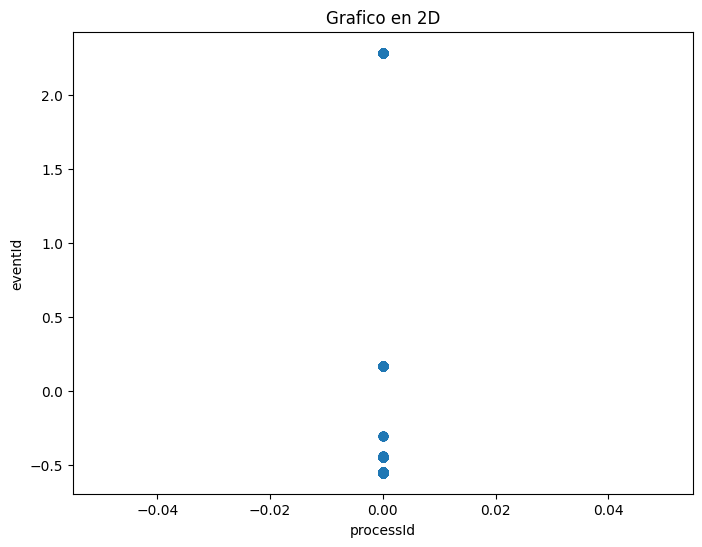

In [ ]:
# Graficar los resultados
fig, ax = plt.subplots(figsize=(8, 6))
scatter = ax.scatter(df_train['processId'], df_train['eventId'])
ax.set_title('Grafico en 2D')
ax.set_xlabel('processId')
ax.set_ylabel('eventId')
# plt.colorbar(scatter)
plt.show()

In [ ]:
import pandas as pd
import plotly.express as px

# Crear gráfico en 3D
fig = px.scatter_3d(df_train, x='processId', y='parentProcessId', z='eventId')
fig.update_layout(title='Gráfico en 3D')
fig.show()


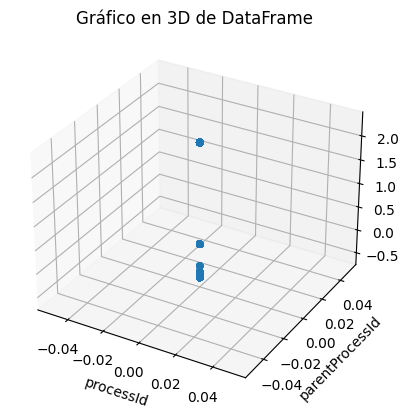

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d

# Crear una figura 3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Graficar los datos en 3D
ax.scatter(df_train['processId'], df_train['parentProcessId'], df_train['eventId'])
ax.set_xlabel('processId')
ax.set_ylabel('parentProcessId')
ax.set_zlabel('eventId')
ax.set_title('Gráfico en 3D de DataFrame')

# Mostrar el gráfico
plt.show()

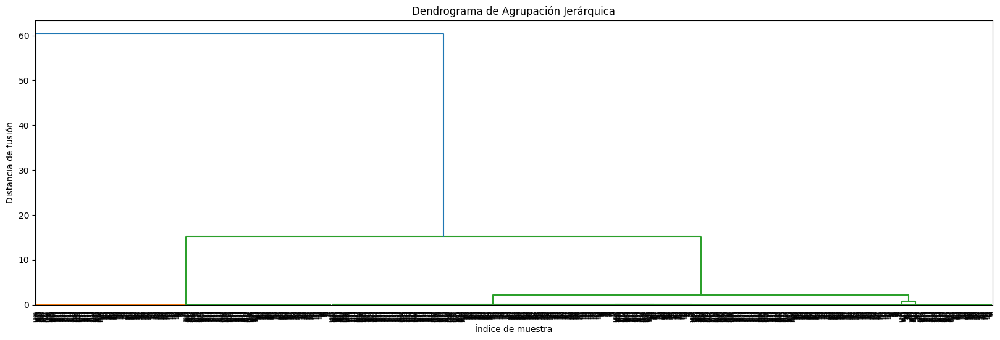

In [ ]:
# Calcular la matriz de enlaces
X = df_train.values
Z = linkage(X, method='ward')

# Graficar el dendrograma
plt.figure(figsize=(20, 6))
dendrogram(Z)
plt.xlabel('Índice de muestra')
plt.ylabel('Distancia de fusión')
plt.title('Dendrograma de Agrupación Jerárquica')
plt.show()


Podemos ver que algunos K optimos pueden ser k=2,3,4,5

Ahora evaluamos la eleccion de K con el metodo del codo

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change fro

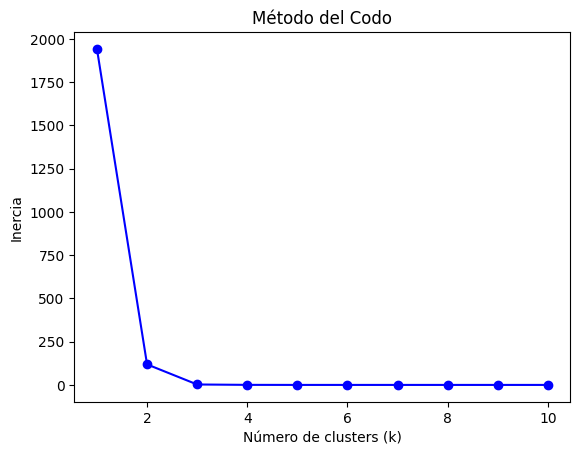

In [ ]:
X = df_train

# Lista para almacenar los valores de inercia (suma de distancias cuadradas)
inercias = []

# Rango de valores de k para probar
k_values = range(1, 11)  # Puedes ajustar el rango según tus necesidades

# Iterar sobre los valores de k y calcular la inercia para cada k
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=0).fit(X)
    inercias.append(kmeans.inertia_)

# Graficar la curva de inercias en función de k
plt.plot(k_values, inercias, 'bo-')
plt.xlabel('Número de clusters (k)')
plt.ylabel('Inercia')
plt.title('Método del Codo')
plt.show()

Del grafico del codo podemos ver que un numero optimo de K es 2 o 3

Ahora si, entrenamos dos modelo con k=2 y k=3

In [ ]:
df_train.head()

,eventId,processId,parentProcessId
1375,-0.554923,0.0,0.0
2091,-0.549253,0.0,0.0
286,-0.554923,0.0,0.0
668,-0.549253,0.0,0.0
406,-0.549253,0.0,0.0


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Puntuación del coeficiente de silueta: 0.8452818287440963


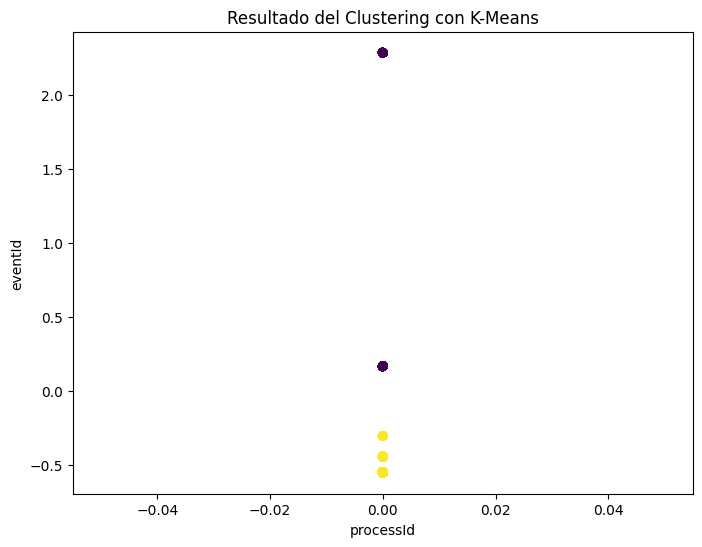

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Seleccionar las columnas que deseas utilizar para el clustering
X = df_train # Reemplaza con los nombres de tus columnas

# Crear un objeto de KMeans con el número de clusters deseado
k = 2  # Número de clusters
kmeans = KMeans(n_clusters=k, random_state=0)

# Entrenar el modelo de KMeans
kmeans.fit(X)

# Obtener las etiquetas de cluster asignadas a cada muestra
labels = kmeans.labels_

# Calcular la puntuación del coeficiente de silueta
silhouette_avg = silhouette_score(X, labels)

# Imprimir la puntuación del coeficiente de silueta
print(f'Puntuación del coeficiente de silueta: {silhouette_avg}')

# Agregar las etiquetas de cluster como una columna al DataFrame original
df_train['cluster'] = labels

# Graficar los resultados
fig, ax = plt.subplots(figsize=(8, 6))
scatter = ax.scatter(df_train['processId'], df_train['eventId'], c=labels, cmap='viridis')
ax.set_title('Resultado del Clustering con K-Means')
ax.set_xlabel('processId')
ax.set_ylabel('eventId')
#plt.colorbar(scatter)
plt.show()

In [ ]:
np.any(np.isnan(df))

In [ ]:
# Crear una instancia del modelo Isolation Forest
modelo = IsolationForest(n_estimators=100, contamination=0.05)

# Ajustar el modelo a los datos
modelo.fit(df)

In [ ]:
#Predecir anomalías:

# Predecir las anomalías en los datos
predicciones = modelo.predict(df)

# Las predicciones son -1 para anomalías y 1 para datos normales
# Puedes obtener la cantidad de anomalías con:
cantidad_anomalias = (predicciones == -1).sum()
print('Cantidad de anomalias: ', cantidad_anomalias)

# También puedes obtener la puntuación de anomalía para cada punto de datos
puntuaciones_anomalia = modelo.decision_function(df)
df['puntuaciones_anomalia'] = puntuaciones_anomalia
df['predicciones'] = predicciones

In [ ]:
df

In [ ]:
df[df['userId']==101]

In [ ]:
# # Evaluar el rendimiento del modelo

# Ajustar hiperparámetros del modelo si es necesario
modelo = IsolationForest(n_estimators=200, contamination=0.1)
modelo.fit(df)


In [ ]:
## Utilizar el modelo entrenado para detectar anomalías en nuevos datos:
# Cargar nuevos datos
nuevos_datos = pd.read_csv('nuevos_datos.csv')

# Aplicar el modelo entrenado para predecir anomalías en los nuevos datos
predicciones_nuevos_datos = modelo.predict(nuevos_datos)

#### Usuario 109

Eleccion de K con Agrupacion Jerarquica

In [ ]:
# Nos quedamos solo con las posibles variables para entrenar un modelo de kmeans

columns = ['processId', 'parentProcessId', 'eventId', 'argsNum', 'returnValue','userId'] #  'processName''',
df_kmeans = df_filtered[columns]
df_kmeans

,processId,parentProcessId,eventId,argsNum,returnValue,userId
0,387,1,41,3,15,101
5,387,1,3,1,0,101
6,387,1,1005,4,0,101
7,387,1,257,4,15,101
8,387,1,5,2,0,101
...,...,...,...,...,...,...
377532,7790,7788,157,5,0,109
378273,7790,7788,1010,0,0,109
378329,7789,7787,1010,0,0,109
378396,383,1,41,3,15,100


In [ ]:
df_kmeans101 = df_kmeans[df_kmeans['userId']==109]
df_kmeans101.drop(['userId'],axis=1, inplace=True)
df_kmeans101

<ipython-input-221-1daca1784f6f>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,processId,parentProcessId,eventId,argsNum,returnValue
94057,7442,7432,1003,1,0
94058,7442,7432,106,1,-1
94059,7442,7432,1003,1,0
94060,7442,7432,1003,1,0
94061,7442,7432,105,1,-1
...,...,...,...,...,...
377530,7790,7788,1003,1,0
377531,7790,7788,157,5,0
377532,7790,7788,157,5,0
378273,7790,7788,1010,0,0


In [ ]:
# Eleccion de atributos 

columns = ['eventId', 'processId', 'parentProcessId',] #  'processName''',
df_kmeans101 = df_kmeans101[columns]
df_kmeans101

,eventId,processId,parentProcessId
94057,1003,7442,7432
94058,106,7442,7432
94059,1003,7442,7432
94060,1003,7442,7432
94061,105,7442,7432
...,...,...,...
377530,1003,7790,7788
377531,157,7790,7788
377532,157,7790,7788
378273,1010,7790,7788


In [ ]:
from sklearn.preprocessing import StandardScaler

# Normalizar los datos
scaler = StandardScaler()
df_encoded_scaled = scaler.fit_transform(df_kmeans101)
df_encoded_scaled = pd.DataFrame(df_encoded_scaled, columns=df_kmeans101.columns)
df_encoded_scaled

,eventId,processId,parentProcessId
0,0.890493,-2.016951,-2.039410
1,-1.175298,-2.016951,-2.039410
2,0.890493,-2.016951,-2.039410
3,0.890493,-2.016951,-2.039410
4,-1.177601,-2.016951,-2.039410
...,...,...,...
103,0.890493,0.855759,0.842614
104,-1.057845,0.855759,0.842614
105,-1.057845,0.855759,0.842614
106,0.906614,0.855759,0.842614


In [ ]:
# Dividimos en train y test 

df_train, df_test = train_test_split(df_encoded_scaled, test_size=0.2, random_state=42)

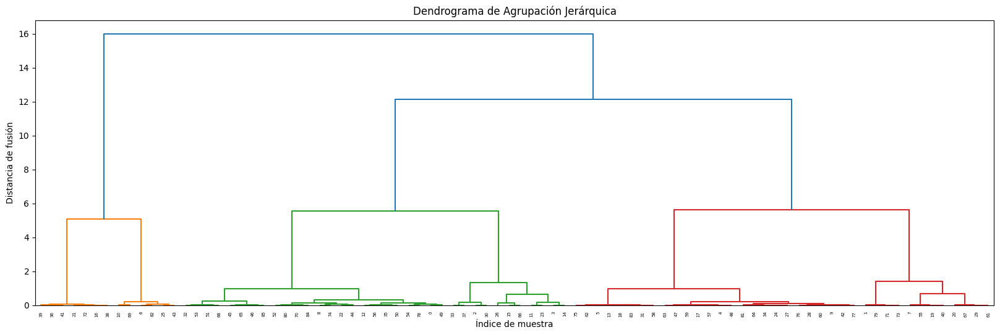

In [ ]:
# Calcular la matriz de enlaces
X = df_train.values
Z = linkage(X, method='ward')

# Graficar el dendrograma
plt.figure(figsize=(20, 6))
dendrogram(Z)
plt.xlabel('Índice de muestra')
plt.ylabel('Distancia de fusión')
plt.title('Dendrograma de Agrupación Jerárquica')
plt.show()


Podemos ver que algunos K optimos pueden ser k= 2 o 3 o 6

Ahora evaluamos la eleccion de K con el metodo del codo

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change fro

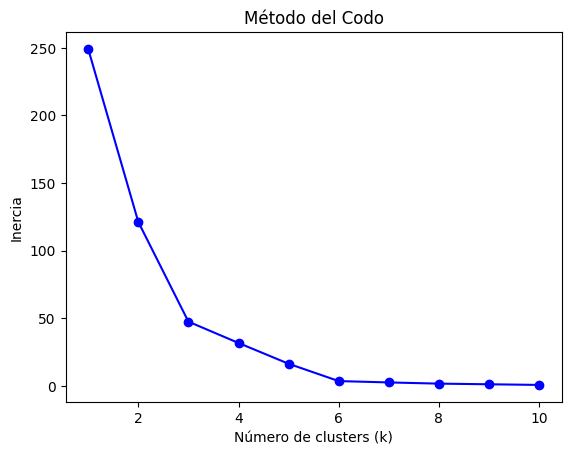

In [ ]:
X = df_train

# Lista para almacenar los valores de inercia (suma de distancias cuadradas)
inercias = []

# Rango de valores de k para probar
k_values = range(1, 11)  # Puedes ajustar el rango según tus necesidades

# Iterar sobre los valores de k y calcular la inercia para cada k
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=0).fit(X)
    inercias.append(kmeans.inertia_)

# Graficar la curva de inercias en función de k
plt.plot(k_values, inercias, 'bo-')
plt.xlabel('Número de clusters (k)')
plt.ylabel('Inercia')
plt.title('Método del Codo')
plt.show()

Del grafico del codo podemos ver que un numero optimo de K es 2 o 4. Ahora si, entrenamos dos modelo con k=2 y k=4

In [ ]:
df_train.head()

,eventId,processId,parentProcessId
64,-1.175298,0.641132,0.640225
26,0.906614,-0.580596,-0.557920
22,-1.177601,-0.580596,-0.557920
31,-1.177601,-0.266909,-0.250288
47,0.890493,0.599857,0.599747


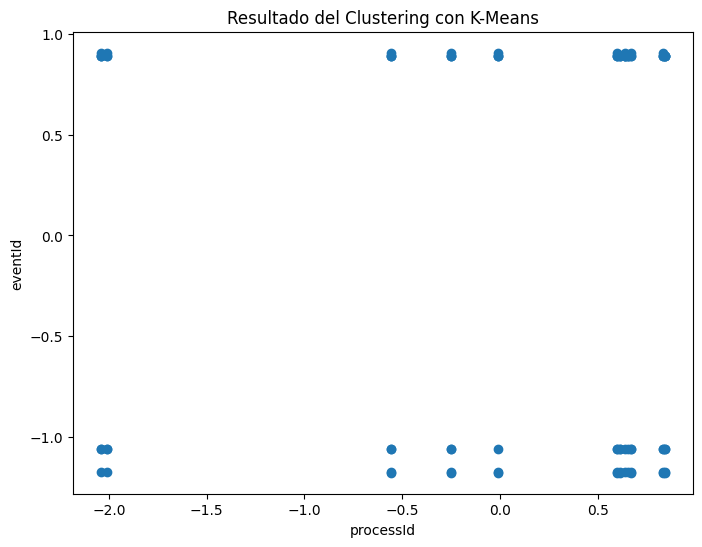

In [ ]:
# Graficar los resultados
fig, ax = plt.subplots(figsize=(8, 6))
scatter = ax.scatter(df_train['parentProcessId'], df_train['eventId'])
ax.set_title('Resultado del Clustering con K-Means')
ax.set_xlabel('processId')
ax.set_ylabel('eventId')
# plt.colorbar(scatter)
plt.show()

In [ ]:
import pandas as pd
import plotly.express as px

# Crear gráfico en 3D
fig = px.scatter_3d(df_train, x='processId', y='parentProcessId', z='eventId')
fig.update_layout(title='Gráfico en 3D de DataFrame')
fig.show()


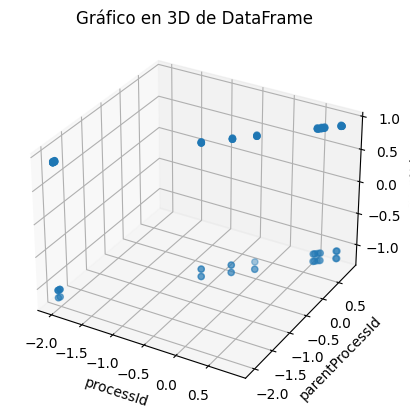

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d

# Crear una figura 3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Graficar los datos en 3D
ax.scatter(df_train['processId'], df_train['parentProcessId'], df_train['eventId'])
ax.set_xlabel('processId')
ax.set_ylabel('parentProcessId')
ax.set_zlabel('eventId')
ax.set_title('Gráfico en 3D de DataFrame')

# Mostrar el gráfico
plt.show()

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Puntuación del coeficiente de silueta: 0.5908756768133834


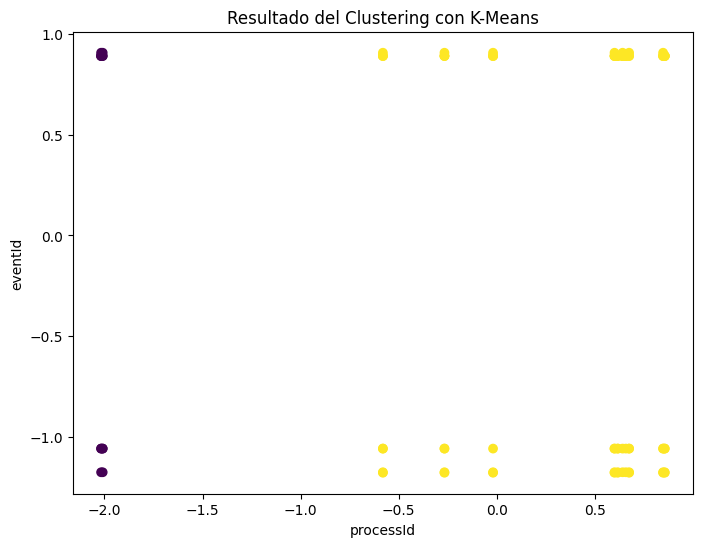

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Seleccionar las columnas que deseas utilizar para el clustering
X = df_train # Reemplaza con los nombres de tus columnas

# Crear un objeto de KMeans con el número de clusters deseado
k = 2  # Número de clusters
kmeans = KMeans(n_clusters=k, random_state=0)

# Entrenar el modelo de KMeans
kmeans.fit(X)

# Obtener las etiquetas de cluster asignadas a cada muestra
labels = kmeans.labels_

# Calcular la puntuación del coeficiente de silueta
silhouette_avg = silhouette_score(X, labels)

# Imprimir la puntuación del coeficiente de silueta
print(f'Puntuación del coeficiente de silueta: {silhouette_avg}')

# Agregar las etiquetas de cluster como una columna al DataFrame original
df_train['cluster'] = labels

# Graficar los resultados
fig, ax = plt.subplots(figsize=(8, 6))
scatter = ax.scatter(df_train['processId'], df_train['eventId'], c=labels, cmap='viridis')
ax.set_title('Resultado del Clustering con K-Means')
ax.set_xlabel('processId')
ax.set_ylabel('eventId')
#plt.colorbar(scatter)
plt.show()

In [ ]:
df_train

,eventId,processId,parentProcessId,cluster
64,-1.175298,0.641132,0.640225,1
26,0.906614,-0.580596,-0.557920,1
22,-1.177601,-0.580596,-0.557920,1
31,-1.177601,-0.266909,-0.250288,1
47,0.890493,0.599857,0.599747,1
...,...,...,...,...
71,0.906614,0.641132,0.640225,1
14,-1.057845,-2.008696,-2.007028,0
92,0.890493,0.847505,0.834519,1
51,-1.057845,0.599857,0.599747,1


In [ ]:
# Denormalizar las columnas A, B, C del DataFrame
df_denormalized = pd.DataFrame(scaler.inverse_transform(df_train.drop), columns=df_train.columns)
df_denormalized

ValueError: ignored

In [ ]:
# Denormalizamos
df_denormalized = scaler.inverse_transform(np.array(df_train))
df_denormalized

ValueError: ignored

#### Usuario 100

Eleccion de K con Agrupacion Jerarquica

In [ ]:
df_kmeans101 = df_kmeans[df_kmeans['userId']==100]
df_kmeans101.drop(['userId'],axis=1, inplace=True)
df_kmeans101

<ipython-input-75-96ceee440eb0>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,processId,parentProcessId,eventId
4171,383,1,41
4176,383,1,3
5377,383,1,41
5382,383,1,3
6585,383,1,41
...,...,...,...
374382,383,1,3
375519,383,1,41
375524,383,1,3
378396,383,1,41


In [ ]:
# VALIDACION CRUZADA

In [ ]:
# Dividimos en train y test 

df_train, df_test = train_test_split(df_kmeans101, test_size=0.2, random_state=42)

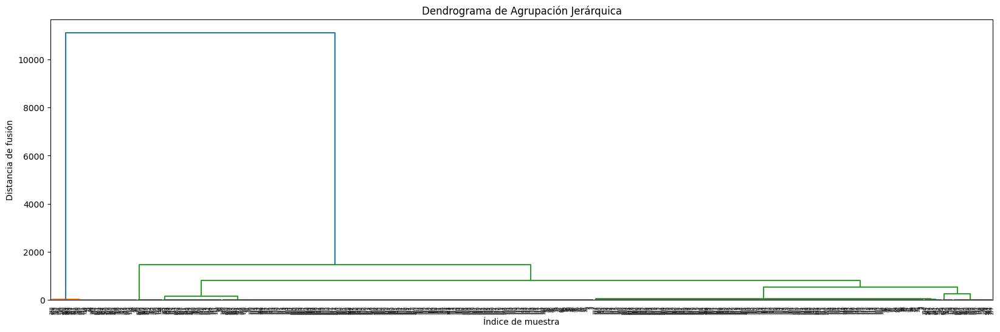

In [ ]:
# Calcular la matriz de enlaces
X = df_train.values
Z = linkage(X, method='ward')

# Graficar el dendrograma
plt.figure(figsize=(20, 6))
dendrogram(Z)
plt.xlabel('Índice de muestra')
plt.ylabel('Distancia de fusión')
plt.title('Dendrograma de Agrupación Jerárquica')
plt.show()


Podemos ver que algunos K optimos pueden ser k= 2 o 3 o 4

Ahora evaluamos la eleccion de K con el metodo del codo

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change fro

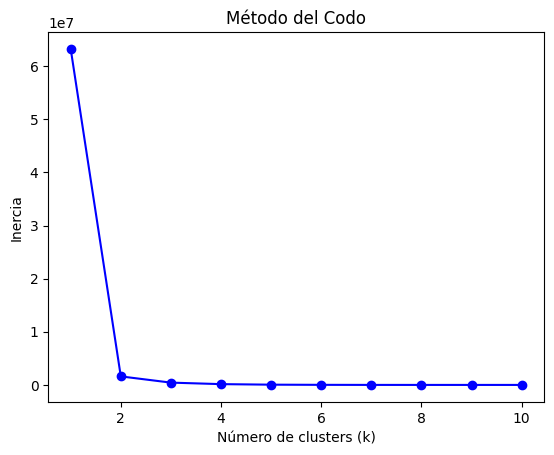

In [ ]:
X = df_train

# Lista para almacenar los valores de inercia (suma de distancias cuadradas)
inercias = []

# Rango de valores de k para probar
k_values = range(1, 11)  # Puedes ajustar el rango según tus necesidades

# Iterar sobre los valores de k y calcular la inercia para cada k
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=0).fit(X)
    inercias.append(kmeans.inertia_)

# Graficar la curva de inercias en función de k
plt.plot(k_values, inercias, 'bo-')
plt.xlabel('Número de clusters (k)')
plt.ylabel('Inercia')
plt.title('Método del Codo')
plt.show()

Del grafico del codo podemos ver que un numero optimo de K es 2 . Ahora si, entrenamos el modelo con k=2 

In [ ]:
df_train.head()

,processId,parentProcessId,eventId
261601,383,1,41
248408,383,1,3
26510,383,1,3
24209,383,1,3
339894,383,1,41


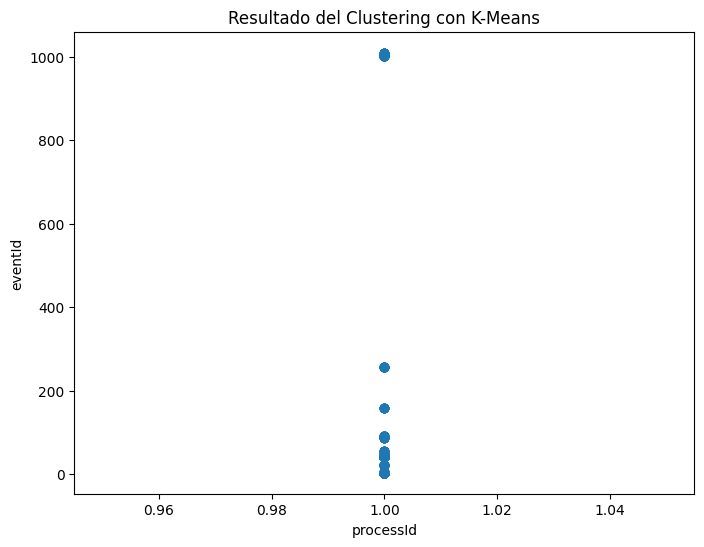

In [ ]:
# Graficar los resultados
fig, ax = plt.subplots(figsize=(8, 6))
scatter = ax.scatter(df_train['parentProcessId'], df_train['eventId'])
ax.set_title('Resultado del Clustering con K-Means')
ax.set_xlabel('processId')
ax.set_ylabel('eventId')
# plt.colorbar(scatter)
plt.show()

In [ ]:
import pandas as pd
import plotly.express as px

# Crear gráfico en 3D
fig = px.scatter_3d(df_train, x='processId', y='parentProcessId', z='eventId')
fig.update_layout(title='Gráfico en 3D de DataFrame')
fig.show()


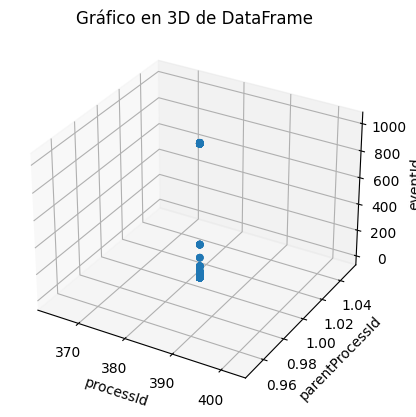

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d

# Crear una figura 3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Graficar los datos en 3D
ax.scatter(df_train['processId'], df_train['parentProcessId'], df_train['eventId'])
ax.set_xlabel('processId')
ax.set_ylabel('parentProcessId')
ax.set_zlabel('eventId')
ax.set_title('Gráfico en 3D de DataFrame')

# Mostrar el gráfico
plt.show()

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Puntuación del coeficiente de silueta: 0.9619086871738375


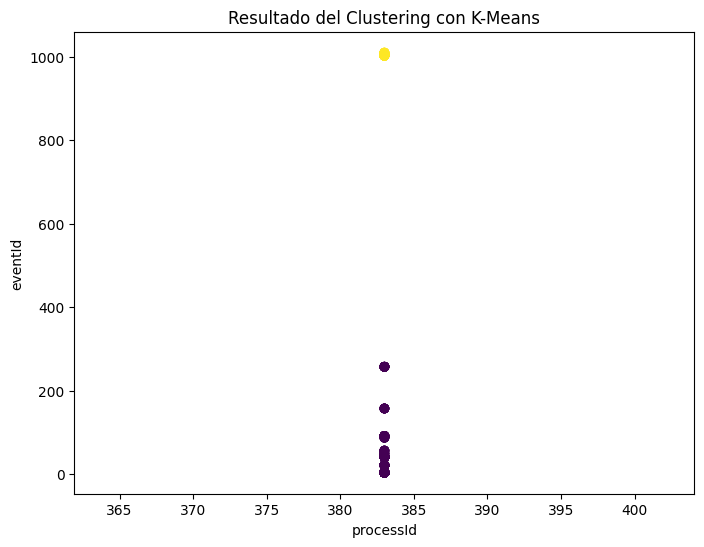

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Seleccionar las columnas que deseas utilizar para el clustering
X = df_train # Reemplaza con los nombres de tus columnas

# Crear un objeto de KMeans con el número de clusters deseado
k = 2  # Número de clusters
kmeans = KMeans(n_clusters=k, random_state=0)

# Entrenar el modelo de KMeans
kmeans.fit(X)

# Obtener las etiquetas de cluster asignadas a cada muestra
labels = kmeans.labels_

# Calcular la puntuación del coeficiente de silueta
silhouette_avg = silhouette_score(X, labels)

# Imprimir la puntuación del coeficiente de silueta
print(f'Puntuación del coeficiente de silueta: {silhouette_avg}')

# Agregar las etiquetas de cluster como una columna al DataFrame original
df_train['cluster'] = labels

# Graficar los resultados
fig, ax = plt.subplots(figsize=(8, 6))
scatter = ax.scatter(df_train['processId'], df_train['eventId'], c=labels, cmap='viridis')
ax.set_title('Resultado del Clustering con K-Means')
ax.set_xlabel('processId')
ax.set_ylabel('eventId')
#plt.colorbar(scatter)
plt.show()

#### Usuario 1000

Eleccion de K con Agrupacion Jerarquica

In [ ]:
df_kmeans101 = df_kmeans[df_kmeans['userId']==1000]
df_kmeans101.drop(['userId'],axis=1, inplace=True)
df_kmeans101

<ipython-input-85-760938298f4e>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,processId,parentProcessId,eventId
61,7238,1075,3
62,7238,1075,3
63,1047,940,3
64,1075,1047,1010
65,7238,1075,1010
...,...,...,...
1466,725,1,3
1467,725,1,3
1468,725,1,3
1470,725,1,1010


In [ ]:
# VALIDACION CRUZADA

In [ ]:
# Dividimos en train y test 

df_train, df_test = train_test_split(df_kmeans101, test_size=0.2, random_state=42)

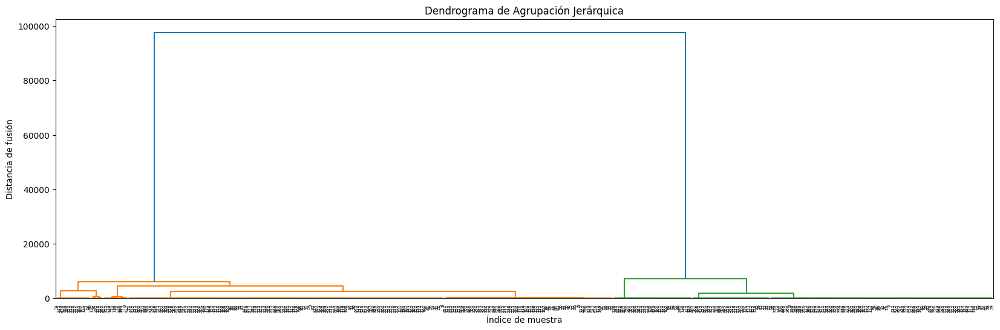

In [ ]:
# Calcular la matriz de enlaces
X = df_train.values
Z = linkage(X, method='ward')

# Graficar el dendrograma
plt.figure(figsize=(20, 6))
dendrogram(Z)
plt.xlabel('Índice de muestra')
plt.ylabel('Distancia de fusión')
plt.title('Dendrograma de Agrupación Jerárquica')
plt.show()


Podemos ver que algunos K optimos pueden ser k= 2 o 3 o 4

Ahora evaluamos la eleccion de K con el metodo del codo

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change fro

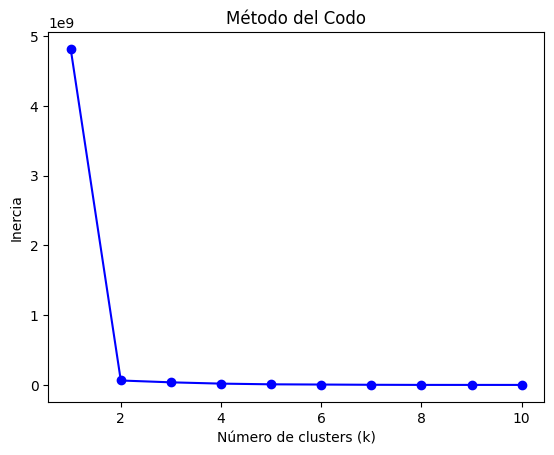

In [ ]:
X = df_train

# Lista para almacenar los valores de inercia (suma de distancias cuadradas)
inercias = []

# Rango de valores de k para probar
k_values = range(1, 11)  # Puedes ajustar el rango según tus necesidades

# Iterar sobre los valores de k y calcular la inercia para cada k
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=0).fit(X)
    inercias.append(kmeans.inertia_)

# Graficar la curva de inercias en función de k
plt.plot(k_values, inercias, 'bo-')
plt.xlabel('Número de clusters (k)')
plt.ylabel('Inercia')
plt.title('Método del Codo')
plt.show()

Del grafico del codo podemos ver que un numero optimo de K es 2 . Ahora si, entrenamos el modelo con k=2 

In [ ]:
df_train.head()

,processId,parentProcessId,eventId
540,911,838,3
171,7260,1047,5
1158,725,1,257
1216,725,1,3
116,7260,1047,3


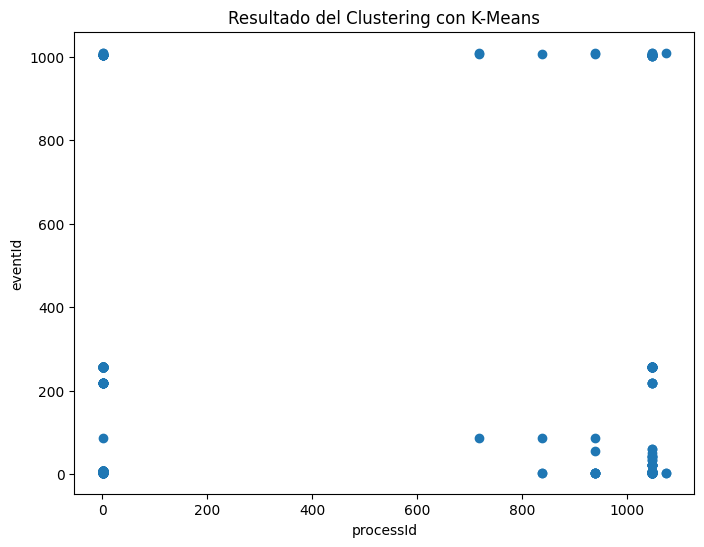

In [ ]:
# Graficar los resultados
fig, ax = plt.subplots(figsize=(8, 6))
scatter = ax.scatter(df_train['parentProcessId'], df_train['eventId'])
ax.set_title('Resultado del Clustering con K-Means')
ax.set_xlabel('processId')
ax.set_ylabel('eventId')
# plt.colorbar(scatter)
plt.show()

In [ ]:
import pandas as pd
import plotly.express as px

# Crear gráfico en 3D
fig = px.scatter_3d(df_train, x='processId', y='parentProcessId', z='eventId')
fig.update_layout(title='Gráfico en 3D de DataFrame')
fig.show()


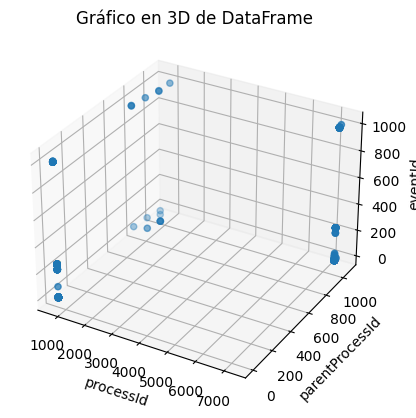

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d

# Crear una figura 3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Graficar los datos en 3D
ax.scatter(df_train['processId'], df_train['parentProcessId'], df_train['eventId'])
ax.set_xlabel('processId')
ax.set_ylabel('parentProcessId')
ax.set_zlabel('eventId')
ax.set_title('Gráfico en 3D de DataFrame')

# Mostrar el gráfico
plt.show()

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Puntuación del coeficiente de silueta: 0.9480508348735653


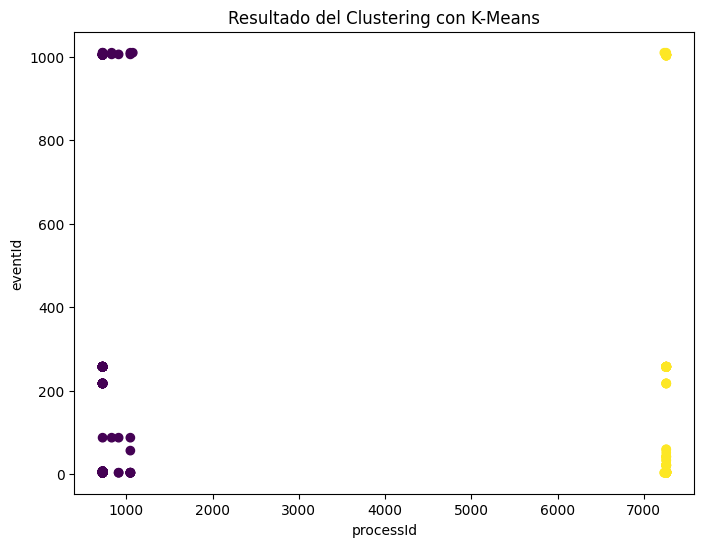

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Seleccionar las columnas que deseas utilizar para el clustering
X = df_train # Reemplaza con los nombres de tus columnas

# Crear un objeto de KMeans con el número de clusters deseado
k = 2  # Número de clusters
kmeans = KMeans(n_clusters=k, random_state=0)

# Entrenar el modelo de KMeans
kmeans.fit(X)

# Obtener las etiquetas de cluster asignadas a cada muestra
labels = kmeans.labels_

# Calcular la puntuación del coeficiente de silueta
silhouette_avg = silhouette_score(X, labels)

# Imprimir la puntuación del coeficiente de silueta
print(f'Puntuación del coeficiente de silueta: {silhouette_avg}')

# Agregar las etiquetas de cluster como una columna al DataFrame original
df_train['cluster'] = labels

# Graficar los resultados
fig, ax = plt.subplots(figsize=(8, 6))
scatter = ax.scatter(df_train['processId'], df_train['eventId'], c=labels, cmap='viridis')
ax.set_title('Resultado del Clustering con K-Means')
ax.set_xlabel('processId')
ax.set_ylabel('eventId')
#plt.colorbar(scatter)
plt.show()